In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import random 
warnings.filterwarnings("ignore")

In [2]:
cells = 10000
tmg_concentration = 4
file_on = f'../simulation_data/gillespie_delta_tmg/gillespie_delta_tmg_on_{tmg_concentration*5}_cells_{cells}.csv'
file_off = f'../simulation_data/gillespie_delta_tmg/gillespie_delta_tmg_off_{tmg_concentration*5}_cells_{cells}.csv'

data_on = pd.read_csv(file_on, delimiter='|')
data_off = pd.read_csv(file_off, delimiter='|')



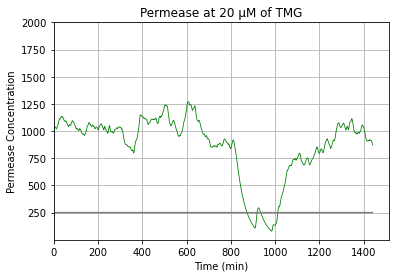

In [14]:
for cell in range(1):
    rand_num = random.randint(1,10000)
    plt.plot(data_on.Time[data_on.Cell == rand_num],data_on.Permease[data_on.Cell == rand_num], 'g-',ms=0.8, label='Initial State On', linewidth=0.8)
    #plt.legend(loc=7)
    plt.title(f'Permease at {tmg_concentration*5} µM of TMG')
    plt.ylabel('Permease Concentration')
    plt.xlabel('Time (min)')
    plt.xlim(0)
    plt.ylim(0.1,2000)
    plt.grid()
plt.plot([250 for i in range(1440)], color='grey')

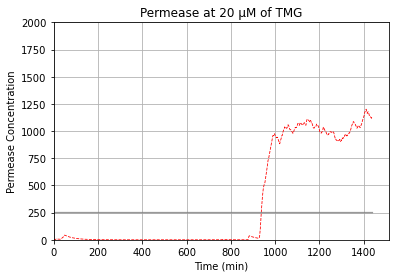

In [15]:
for cell in range(1):
    rand_num = random.randint(1,10000)
    plt.plot(data_off.Time[data_off.Cell == rand_num],data_off.Permease[data_off.Cell == rand_num], 'r--',ms=0.8, label='Initial State Off', linewidth=0.8)
    #plt.legend(loc=7)
    plt.title(f'Permease at {tmg_concentration*5} µM of TMG')
    plt.ylabel('Permease Concentration')
    plt.xlabel('Time (min)')
    plt.xlim(0)
    plt.ylim(0,2000)
    plt.grid()
plt.plot([250 for i in range(1440)], color='grey', alpha=0.8)

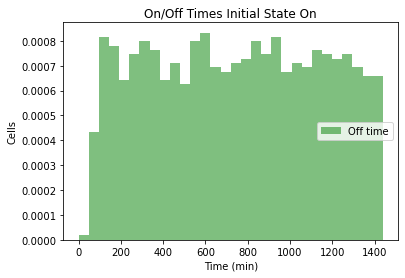

In [5]:
plt.hist(pd.unique(data_on.Off_Time),bins=30,color='green',alpha=0.5,label='Off time', density=True);
plt.title(f'On/Off Times Initial State On')
plt.xlabel('Time (min)')
plt.ylabel('Cells')
plt.legend(loc=7)

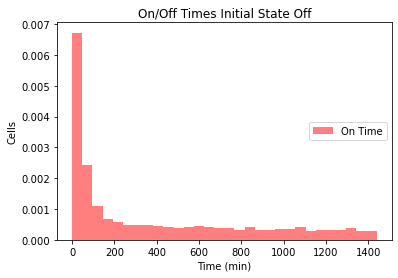

In [6]:
plt.hist(pd.unique(data_off.On_Time), bins=30,color='red',alpha=0.5,label='On Time', density=True);
plt.title(f'On/Off Times Initial State Off')
plt.xlabel('Time (min)')
plt.ylabel('Cells')
plt.legend(loc=7)


In [7]:
head_time = data_off[data_off.Time == 1439].On_Time.head(50)

Text(0, 0.5, 'Cells')

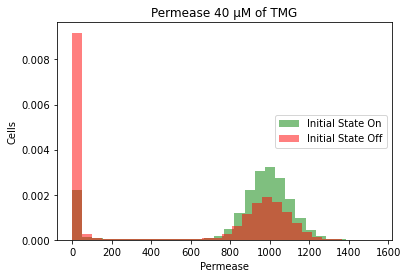

In [8]:

plt.hist(data_on.Permease[data_on.Time >= 1400], bins=30,color='green',alpha=0.5,label='Initial State On', density=True)
plt.hist(data_off.Permease[data_off.Time >= 1400], bins=30,color='red',alpha=0.5,label='Initial State Off',density=True)
plt.legend(loc=7)
plt.title(f'Permease {tmg_concentration*10} µM of TMG')
plt.xlabel('Permease')
plt.ylabel('Cells')


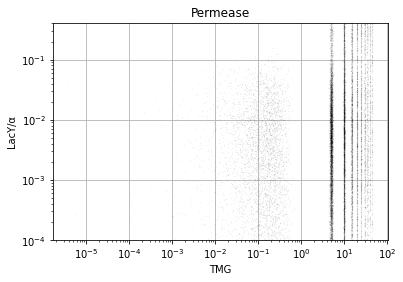

In [16]:
for tmg_concentration in range(10):

    cells = 10000
    factor = 5
    alpha = 1000
    file_on = f'../simulation_data/gillespie_delta_tmg/gillespie_delta_tmg_on_{tmg_concentration*factor}_cells_{cells}.csv'

    data_on = pd.read_csv(file_on, delimiter='|')

    plt.plot((np.random.normal(loc = 0, scale=0.2, size=cells) + (tmg_concentration*5)),data_on.Permease[data_on.Time == 1440]/alpha, 'ok', ms=0.02)
    plt.title('Permease')
    plt.xlabel('TMG')
    plt.ylabel('LacY/α')
    plt.yscale('log')
    plt.xscale('log')
    plt.ylim(pow(1*10,-4))
plt.grid(True)

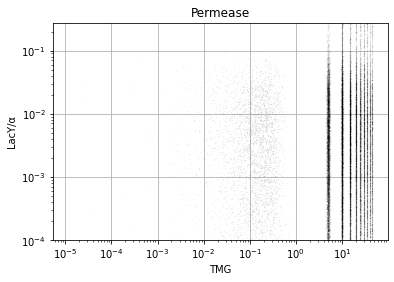

In [17]:
for tmg_concentration in range(10):

    cells = 10000
    factor = 5 
    alpha = 1000

    file_off = f'../simulation_data/gillespie_delta_tmg/gillespie_delta_tmg_off_{tmg_concentration*factor}_cells_{cells}.csv'
    data_off = pd.read_csv(file_off, delimiter='|')

    plt.plot((np.random.normal(loc = 0, scale=0.2, size=cells) + (tmg_concentration*factor)), data_off.Permease[data_off.Time == 1440]/alpha, 'ok', ms=0.02)
    plt.yscale('log')
    plt.xscale('log')
    plt.title('Permease')
    plt.title('Permease')
    plt.xlabel('TMG')
    plt.ylabel('LacY/α')
    plt.ylim(pow(1*10,-4))
plt.grid(True)

In [12]:
tmg = 20
file_on = f'../simulation_data/gillespie_delta_tmg/gillespie_delta_tmg_on_{tmg}_cells_10000.csv';
file_off = f'../simulation_data/gillespie_delta_tmg/gillespie_delta_tmg_off_{tmg}_cells_10000.csv';

data_on_3 = pd.read_csv(file_on, delimiter='|');
data_off_3 = pd.read_csv(file_off, delimiter='|');


In [13]:
times = [i*20 for i in range(1,73)]
for time_ in times:
    plt.hist(data_on_3.Permease[data_on_3.Time == time_], bins=60,color='green',alpha=0.6, density=True, label='Initial State On');
    plt.title(f'Permease at {tmg} µM of TMG \n Time: {time_} min')
    plt.xlabel('Permease')
    plt.ylabel('Cells')
    plt.legend(loc=7) 
    plt.ylim(0, 0.010)
    plt.xlim(0,1650)
    plt.savefig(f'./to_gif/hist_tmg_{tmg}_time_{time_}.jpg');
    plt.close()

In [14]:
times = [i*20 for i in range(1,73)]
for time_ in times:
    plt.hist(data_off_3.Permease[data_off_3.Time == time_], bins=60,color='red',alpha=0.6,density=True, label='Initial State Off')
    plt.title(f'Permease at {tmg} µM of TMG \n Time: {time_} min')
    plt.xlabel('Permease')
    plt.ylabel('Cells')
    plt.legend(loc=7) 
    plt.ylim(0, 0.035)
    plt.xlim(0,1650)
    plt.savefig(f'./to_gif/hist_tmg_{tmg}_time_{time_}.jpg');
    plt.close()